<a href="https://colab.research.google.com/github/duchaba/Data-Augmentation-with-Python/blob/main/data_augmentation_with_python_chapter_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Data Augmentation with Python, Chapter 8

## 🌻 Welcome to Chapter 8, "Audio spectrograme Augmentation"


This chapter will cover Audio augmentation using Waveform transformation, and in particular, the following topics:   

- xxx

# Load Notebook


- This Notebook original link is: 
  - https://github.com/PacktPublishing/Data-Augmentation-with-Python/blob/main/data_augmentation_with_python_chapter_7.ipynb

# GitHub Clone

In [1]:
# git version should be 2.17.1 or higher
!git --version

git version 2.17.1


In [2]:
url = 'https://github.com/PacktPublishing/Data-Augmentation-with-Python'
# url = 'https://github.com/duchaba/Data-Augmentation-with-Python'
!git clone {url}

Cloning into 'Data-Augmentation-with-Python'...
remote: Enumerating objects: 58, done.
remote: Counting objects: 100% (36/36), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 58 (delta 21), reused 17 (delta 8), pack-reused 22
Unpacking objects: 100% (58/58), done.


## Fetch file from URL (Optional)

- Uncommend the below 2 code cells if you want to use URL and not Git Clone

In [3]:
# import requests
# #
# def fetch_file(url, dst):
#   downloaded_obj = requests.get(url)
#   with open(dst, "wb") as file:
#     file.write(downloaded_obj.content)
#   return

In [4]:
# url = ''
# dst = 'pluto_chapter_1.py'
# fetch_file(url,dst)

# Run Pluto

- Instantiate up Pluto, aka. "Pluto, wake up!"

In [5]:
# %% CARRY-OVER code install

!pip install opendatasets --upgrade
!pip install pyspellchecker 
!pip install audiomentations


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 24.1 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.0/66.0 KB 2.0 MB/s eta 0:00:00


In [6]:
#load and run the pluto chapter 7 Python code.
pluto_file = 'Data-Augmentation-with-Python/pluto/pluto_chapter_7.py'
%run {pluto_file}

---------------------------- : ----------------------------
            Hello from class : <class '__main__.PacktDataAug'> Class: PacktDataAug
                   Code name : Pluto
                   Author is : Duc Haba
---------------------------- : ----------------------------


## Verify Pluto

In [7]:
pluto.say_sys_info()

---------------------------- : ----------------------------
                 System time : 2023/01/15 04:02
                    Platform : linux
     Pluto Version (Chapter) : 7.0
             Python (3.7.10) : actual: 3.8.16 (default, Dec  7 2022, 01:12:13) [GCC 7.5.0]
            PyTorch (1.11.0) : actual: 1.13.0+cu116
              Pandas (1.3.5) : actual: 1.3.5
                 PIL (9.0.0) : actual: 7.1.2
          Matplotlib (3.2.2) : actual: 3.2.2
                   CPU count : 2
                  *CPU speed : NOT available
---------------------------- : ----------------------------


## (Optional) Export to .py

In [8]:
pluto_chapter_8 = 'Data-Augmentation-with-Python/pluto/pluto_chapter_8.py'
!cp {pluto_file} {pluto_chapter_8}

In [9]:
# # list attributes
# pluto.__dict__

In [10]:
# # list attributes, function, and everything else
# dir(pluto)

# ✋ Set up Kaggle username and app Key

- Install the following libraries, and import it on the Notebook.
- Follow by initialize Kaggle username, key and fetch methods.

- STOP: Update your Kaggle access username or key first.

In [11]:
# %%CARRY-OVER code 

# -------------------- : --------------------
# READ ME
# Chapter 2 begin:
# Install the following libraries, and import it on the Notebook.
# Follow by initialize Kaggle username, key and fetch methods.
# STOP: Update your Kaggle access username or key first.
# -------------------- : --------------------

!pip install opendatasets --upgrade
import opendatasets
print("\nrequired version 0.1.22 or higher: ", opendatasets.__version__)

!pip install pyspellchecker 
import spellchecker
print("\nRequired version 0.7+", spellchecker.__version__)

# STOP: Update your Kaggle access username or key first.
pluto.remember_kaggle_access_keys("duchaba", "059d7f10e1838693868b30e9dbb7c8ce")
pluto._write_kaggle_credit()
import kaggle

@add_method(PacktDataAug)
def fetch_kaggle_comp_data(self,cname):
  #self._write_kaggle_credit()  # need to run only once.
  path = pathlib.Path(cname)
  kaggle.api.competition_download_cli(str(path))
  zipfile.ZipFile(f'{path}.zip').extractall(path)
  return

@add_method(PacktDataAug)
def fetch_kaggle_dataset(self,url,dest="kaggle"):
  #self._write_kaggle_credit()    # need to run only once.
  opendatasets.download(url,data_dir=dest)
  return
# -------------------- : --------------------


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

required version 0.1.22 or higher:  0.1.22
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/

Required version 0.7+ 0.7.1


# Fetch Kaggle Data

## Musical Emotions Classification

In [12]:
%%time
url = 'https://www.kaggle.com/datasets/kingofarmy/musical-emotions-classification'
pluto.fetch_kaggle_dataset(url)

100%|██████████| 641M/641M [00:11<00:00, 57.6MB/s]



CPU times: user 7.16 s, sys: 5.54 s, total: 12.7 s
Wall time: 20.3 s


In [13]:
f = 'kaggle/musical-emotions-classification/Train.csv'
pluto.df_music_data = pluto.fetch_df(f)
pluto.df_music_data.head(3)

,GroupID,ImageID,Target,Shapes
0,Happy102,Happy10200.wav,Happy,220608
1,Happy102,Happy10201.wav,Happy,220608
2,Happy102,Happy10202.wav,Happy,220608


In [14]:
# # /content/kaggle/musical-emotions-classification/Audio_Files/Audio_Files/Train/Happy/Happy10200.wav
# # remove white space in directory and filename
# # run this until no error/output
# f = 'kaggle/sea-animals-image-dataste'
# #!find {f} -name "* *" -type d | rename 's/ /_/g'
# !find {f} -name "* *" -type f | rename 's/ /_/g'

In [15]:
# %%writefile -a {pluto_chapter_7}

pluto.version = 7.0
# augment full path
@add_method(PacktDataAug)
def _append_music_full_path(self,x):
  y = re.findall('([a-zA-Z ]*)\d*.*', x)[0]
  return (f'kaggle/musical-emotions-classification/Audio_Files/Audio_Files/Train/{y}/{x}')
#
@add_method(PacktDataAug)
def fetch_music_full_path(self, df):
  df['fname'] = df.ImageID.apply(self._append_music_full_path)
  return df

In [16]:
pluto.fetch_music_full_path(pluto.df_music_data)
pluto.df_music_data.head(3)

,GroupID,ImageID,Target,Shapes,fname
0,Happy102,Happy10200.wav,Happy,220608,kaggle/musical-emotions-classification/Audio_F...
1,Happy102,Happy10201.wav,Happy,220608,kaggle/musical-emotions-classification/Audio_F...
2,Happy102,Happy10202.wav,Happy,220608,kaggle/musical-emotions-classification/Audio_F...


## Human Speech

In [17]:
%%time
url = 'https://www.kaggle.com/datasets/ejlok1/cremad'
pluto.fetch_kaggle_dataset(url)

100%|██████████| 451M/451M [00:03<00:00, 142MB/s]



CPU times: user 8.03 s, sys: 2.9 s, total: 10.9 s
Wall time: 14.5 s


In [18]:
# /content/kaggle/cremad/AudioWAV/1001_DFA_ANG_XX.wav
# change method name to make_dir_dframe
f = 'kaggle/cremad/AudioWAV'
pluto.df_voice_data = pluto.make_dir_dataframe(f)
pluto.df_voice_data.head(3)

,fname,label
0,kaggle/cremad/AudioWAV/1050_TAI_HAP_XX.wav,AudioWAV
1,kaggle/cremad/AudioWAV/1002_IEO_ANG_MD.wav,AudioWAV
2,kaggle/cremad/AudioWAV/1009_DFA_NEU_XX.wav,AudioWAV


In [19]:
pluto.df_voice_data.head(3)

,fname,label
0,kaggle/cremad/AudioWAV/1050_TAI_HAP_XX.wav,AudioWAV
1,kaggle/cremad/AudioWAV/1002_IEO_ANG_MD.wav,AudioWAV
2,kaggle/cremad/AudioWAV/1009_DFA_NEU_XX.wav,AudioWAV


## Urban sound

In [20]:
%%time
url = 'https://www.kaggle.com/datasets/rupakroy/urban-sound-8k'
pluto.fetch_kaggle_dataset(url)

100%|██████████| 5.61G/5.61G [00:53<00:00, 113MB/s]



CPU times: user 1min 12s, sys: 26.5 s, total: 1min 39s
Wall time: 2min 15s


In [21]:
# /content/kaggle/urban-sound-8k/UrbanSound8K/UrbanSound8K/audio/fold1
# change method name to make_dir_dframe
f = 'kaggle/urban-sound-8k/UrbanSound8K/UrbanSound8K/audio'
pluto.df_sound_data = pluto.make_dir_dataframe(f)
pluto.df_sound_data.head(3)

,fname,label
0,kaggle/urban-sound-8k/UrbanSound8K/UrbanSound8...,fold5
1,kaggle/urban-sound-8k/UrbanSound8K/UrbanSound8...,fold5
2,kaggle/urban-sound-8k/UrbanSound8K/UrbanSound8...,fold5


# Audio control D Major

In [22]:
# %%writefile -a {pluto_chapter_7}

f = 'Data-Augmentation-with-Python/pluto_data/control-d-major.mp3'
data_amp, sam_rate, fname = pluto._fetch_audio_data(f)
pluto.audio_control_dmajor = [data_amp, sam_rate, fname, f]

/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


# View and Listen

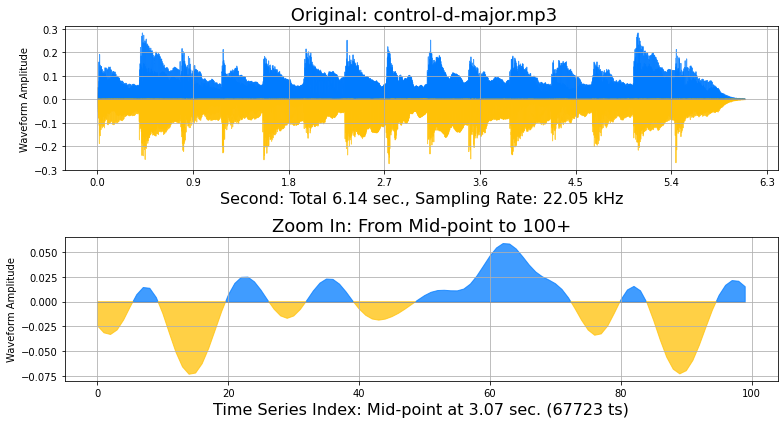

In [23]:

pluto._draw_audio(data_amp, sam_rate, 'Original: ' + fname)
# display audio 
display(IPython.display.Audio(data_amp, rate=sam_rate))

In [24]:
pluto.audio_control_dmajor

[array([ 1.1140079e-06, -1.9093377e-06,  3.5788566e-06, ...,
         1.3608570e-06,  1.5689280e-04,  0.0000000e+00], dtype=float32),
 22050,
 'control-d-major.mp3',
 'Data-Augmentation-with-Python/pluto_data/control-d-major.mp3']

In [25]:
# %%writefile -a {pluto_chapter_8}

@add_method(PacktDataAug)
def _draw_spectrogram(self, data_amp, sam_rate, 
  fname='Spectrogram',
  window=matplotlib.mlab.window_hanning,
  cmap='viridis',
  sides='default',
  mode='default'):
  canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
  spec, freq, ts, ax = pic.specgram(data_amp, 
    Fs=sam_rate,
    window=window,
    cmap=cmap,
    sides=sides,
    mode=mode)
  pic.set_xlabel('Time, Sampling Rate: '+str(sam_rate),fontsize=16.)
  pic.set_ylabel('Frequency (Hz)',fontsize=16.)
  pic.set_title(fname,fontsize=18.0)
  #
  # display and save image
  canvas.tight_layout()
  self._drop_image(canvas)
  canvas.show()
  return spec, freq, ts, ax

In [26]:
# pluto._fetch_audio_data??

In [50]:
# %%writefile -a {pluto_chapter_8}

@add_method(PacktDataAug)
def draw_spectrogram(self, df,
  fname='Spectrogram',
  window=matplotlib.mlab.window_hanning,
  cmap='viridis',
  sides='default',
  mode='default'):
  if (type(df) is list):
    data_amp, sam_rate, fname, lname = self.audio_control_dmajor
  else:
    lname = self._fetch_1_sample(df)
    data_amp, sam_rate, fname = self._fetch_audio_data(lname)
  #
  spec, freq, ts, ax = self._draw_spectrogram(data_amp, sam_rate,
    fname='Spectrogram: '+fname,
    window=window,
    cmap=cmap,
    sides=sides,
    mode=mode)
  # display audio 
  display(IPython.display.Audio(data_amp,rate=sam_rate))
  return
#
@add_method(PacktDataAug)
def _draw_melspectrogram(self, mel_db, sam_rate, data_amp,
  fname='MelSpectrogram',
  cmap='viridis',
  y_axis='mel',
  y_label='Mel scale (Hz)'):
  canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
  #
  img = librosa.display.specshow(mel_db, 
    sr=sam_rate,
    x_axis='time',
    y_axis=y_axis,
    fmax=8000, 
    ax=pic,
    cmap=cmap)
  canvas.colorbar(img, ax=pic, format='%+2.0f dB')
  #
  pic.set_xlabel('Time, Sampling Rate: '+str(sam_rate),fontsize=16.)
  pic.set_ylabel(y_label,fontsize=16.)
  pic.set_title(fname,fontsize=18.0)
  #
  # display and save image
  canvas.tight_layout()
  self._drop_image(canvas)
  canvas.show()
  # display audio 
  display(IPython.display.Audio(data_amp,rate=sam_rate))
  return
#
@add_method(PacktDataAug)
def draw_melspectrogram(self, df,
  fname='MelSpectrogram',
  cmap='viridis',
  is_chroma=False):
  if (type(df) is list):
    data_amp, sam_rate, fname, lname = self.audio_control_dmajor
  else:
    lname = self._fetch_1_sample(df)
    data_amp, sam_rate, fname = self._fetch_audio_data(lname)
  #
  canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
  #
  if (is_chroma):
    mel_db = librosa.feature.chroma_stft(data_amp, 
      sr=sam_rate)
    yax = 'chroma'
    ylab = 'Pitch class'
    tname = 'Chroma STFT: ' + fname
  else:
    mel = librosa.feature.melspectrogram(y=data_amp, 
    sr=sam_rate, 
    n_mels=128,
    fmax=8000)
    mel_db = librosa.power_to_db(mel, ref=numpy.max)
    yax = 'mel'
    ylab = 'Mel scale (Hz)'
    tname = 'Melspectrogram: ' + fname
  #
  self._draw_melspectrogram(mel_db, sam_rate, data_amp,
    cmap=cmap,
    fname=tname,
    y_axis=yax,
    y_label = ylab)
  return
#

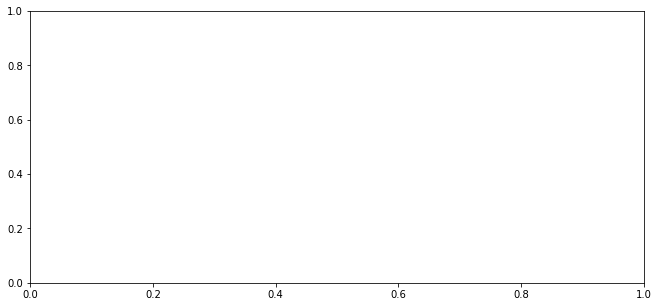

In [28]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))

In [29]:
# matplotlib.pyplot.specgram?

In [30]:
# pluto.draw_spectrogram?

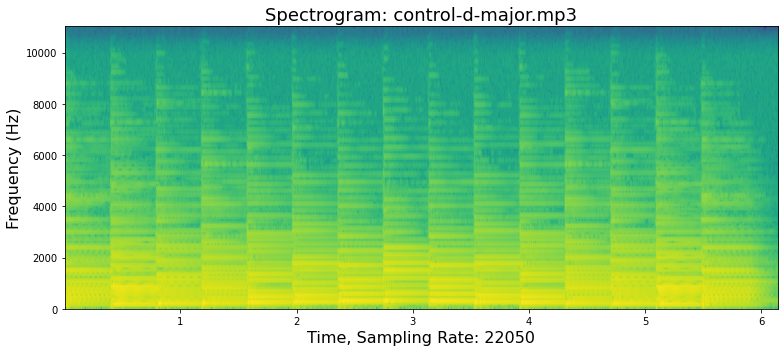

In [31]:
pluto.draw_spectrogram(pluto.audio_control_dmajor)

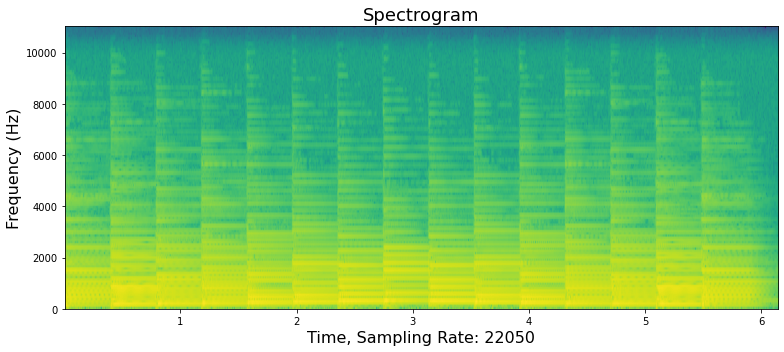

In [32]:
spec, freq, ts, ax = pluto._draw_spectrogram(pluto.audio_control_dmajor[0], pluto.audio_control_dmajor[1])

/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


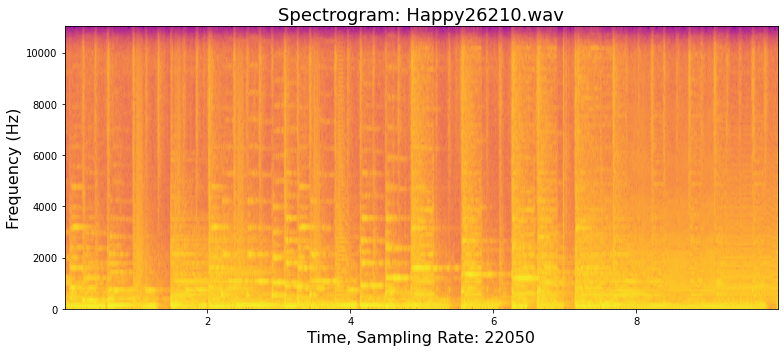

In [33]:
pluto.draw_spectrogram(pluto.df_music_data, cmap='plasma')

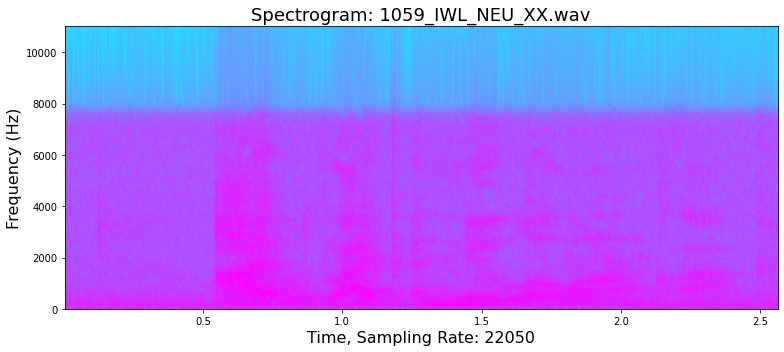

In [34]:
pluto.draw_spectrogram(pluto.df_voice_data, cmap='cool')

In [35]:
# the air plan is almost full

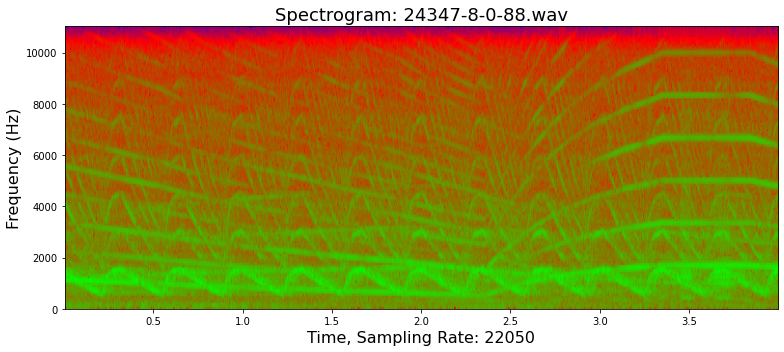

In [36]:
pluto.draw_spectrogram(pluto.df_sound_data, cmap='brg')

In [37]:
# street music and rain

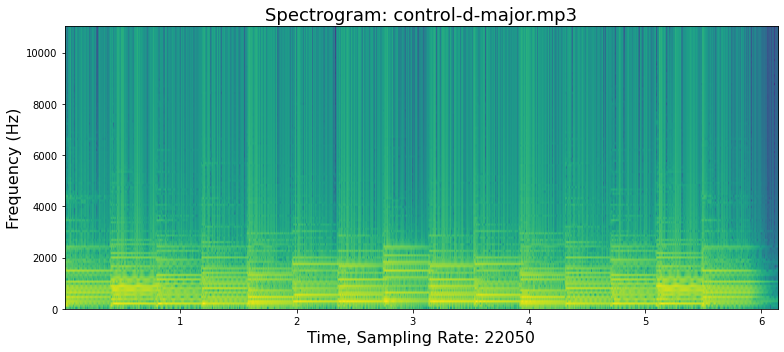

In [38]:
pluto.draw_spectrogram(pluto.audio_control_dmajor,
  window=matplotlib.mlab.window_none)

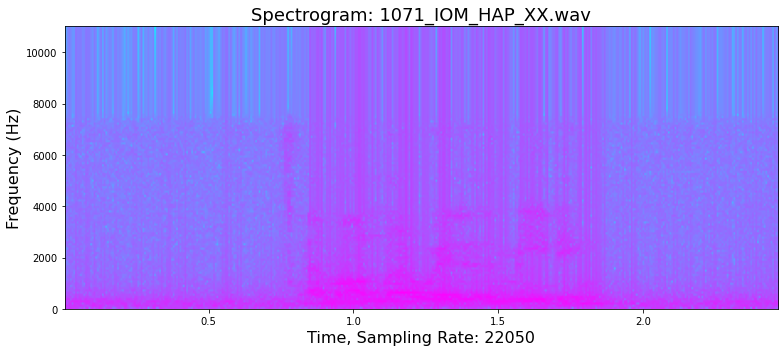

In [39]:
pluto.draw_spectrogram(pluto.df_voice_data,
  cmap='cool',
  window=matplotlib.mlab.window_none)

In [40]:
# it is 11 o'clock

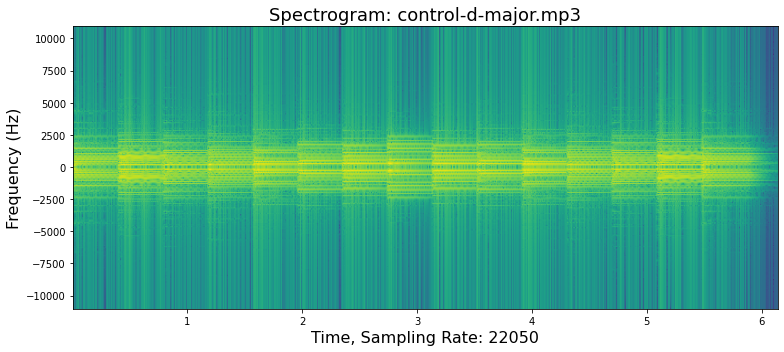

In [41]:
pluto.draw_spectrogram(pluto.audio_control_dmajor,
  window=matplotlib.mlab.window_none,
  sides='twosided')

/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


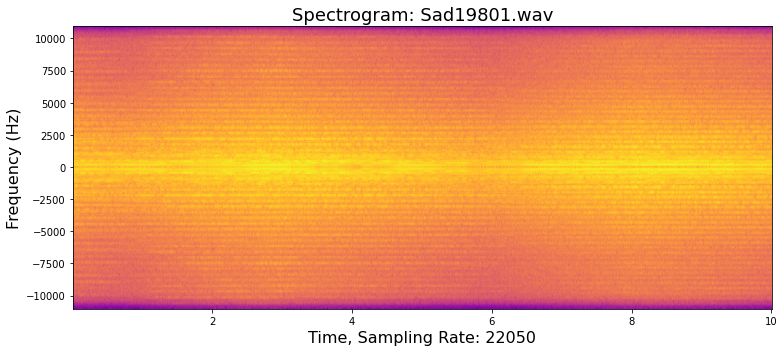

In [42]:
pluto.draw_spectrogram(pluto.df_music_data, 
  cmap='plasma',
  sides='twosided')

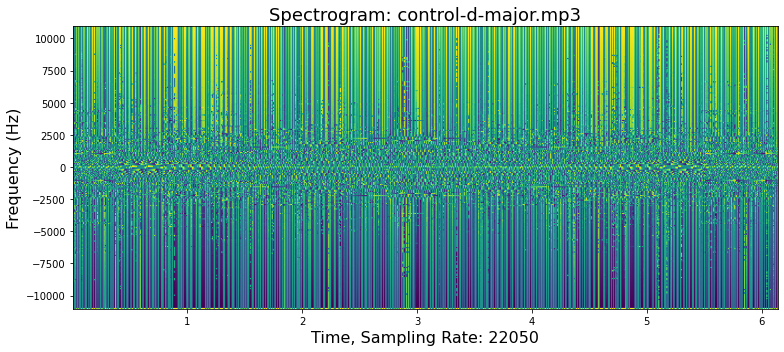

In [43]:
pluto.draw_spectrogram(pluto.audio_control_dmajor,
  window=matplotlib.mlab.window_none,
  sides='twosided',
  mode='angle')

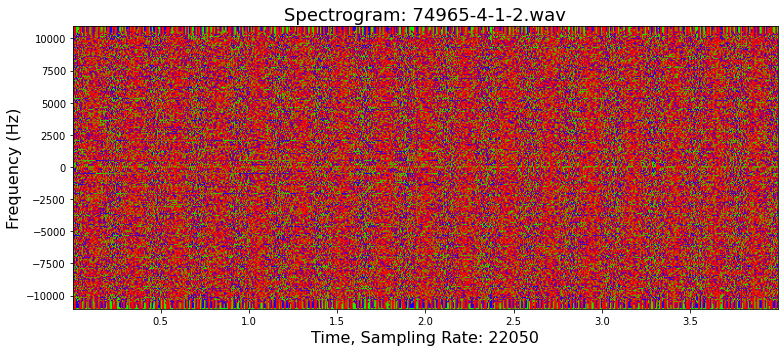

In [44]:
pluto.draw_spectrogram(pluto.df_sound_data,
  cmap='brg',
  window=matplotlib.mlab.window_none,
  sides='twosided',
  mode='angle')

In [45]:
# chiqwawa barking

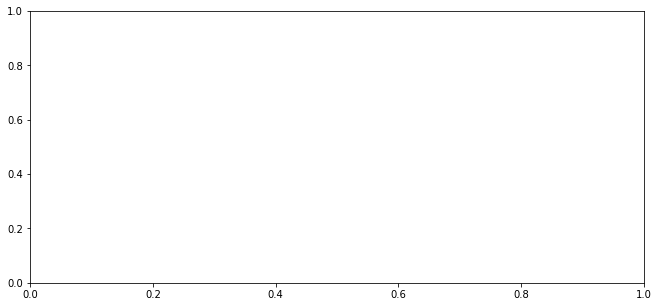

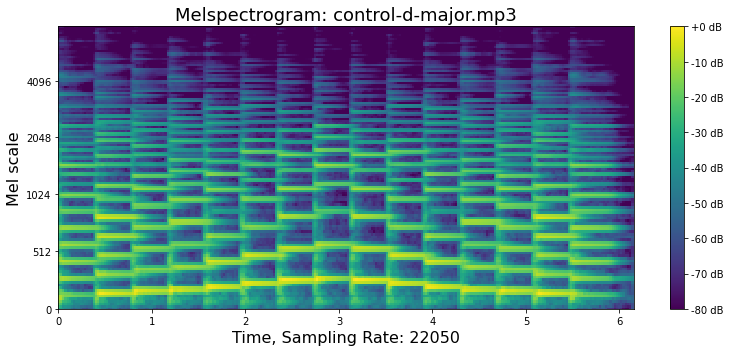

In [46]:
pluto.draw_melspectrogram(pluto.audio_control_dmajor)

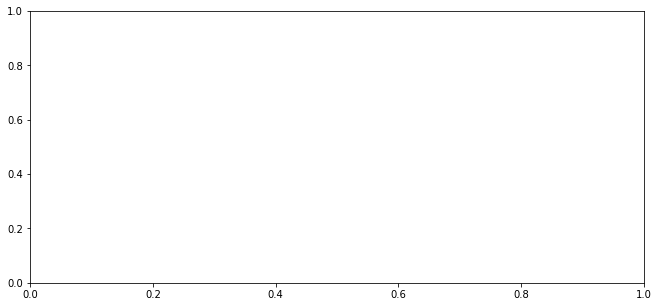

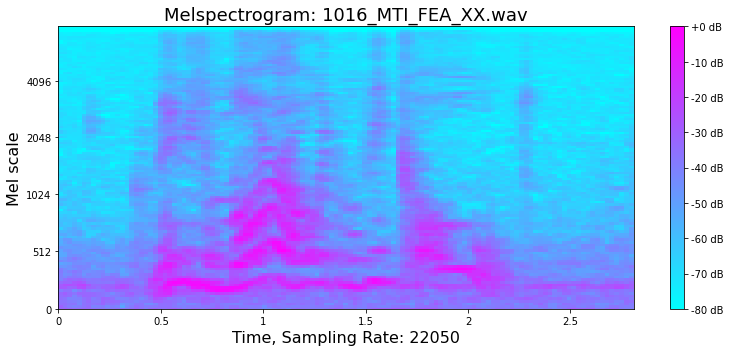

In [47]:
pluto.draw_melspectrogram(pluto.df_voice_data, cmap='cool')

In [54]:
# woman, that is exactly what happens
pluto.fname_id

17

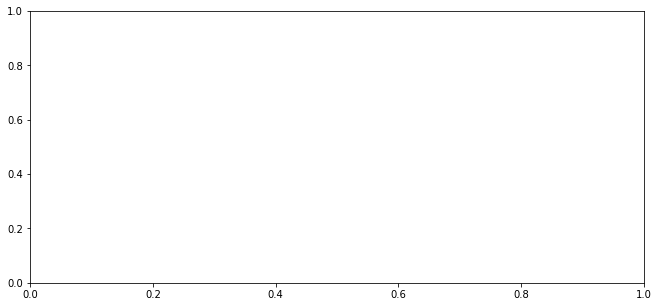

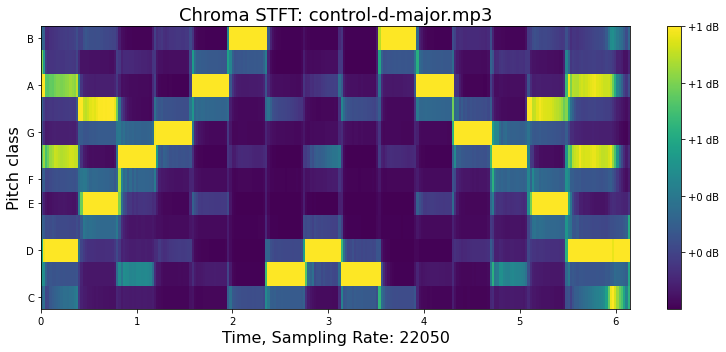

In [51]:
pluto.draw_melspectrogram(pluto.audio_control_dmajor, is_chroma=True)

/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


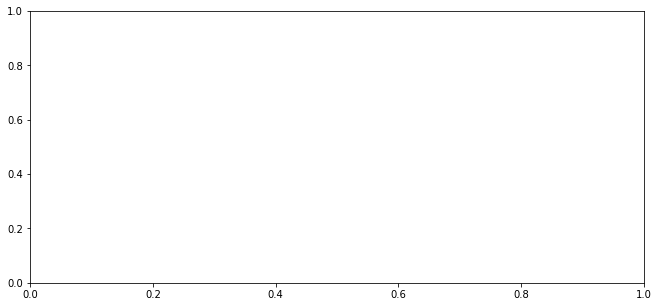

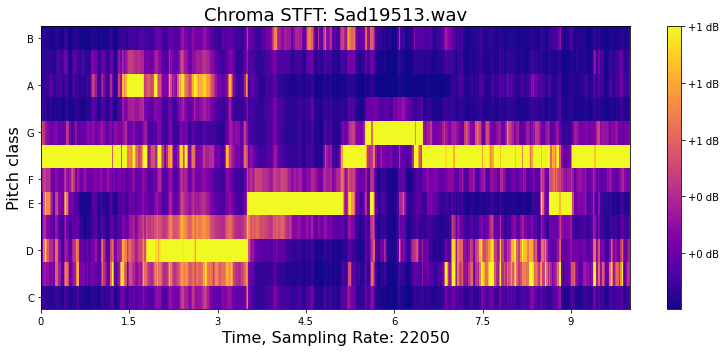

In [53]:
pluto.draw_melspectrogram(pluto.df_music_data, is_chroma=True, cmap='plasma')

In [ ]:
# cinamic strong violen

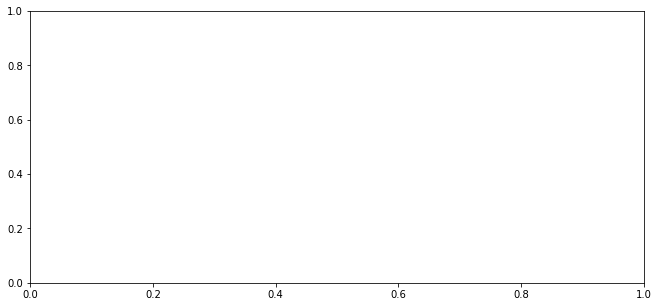

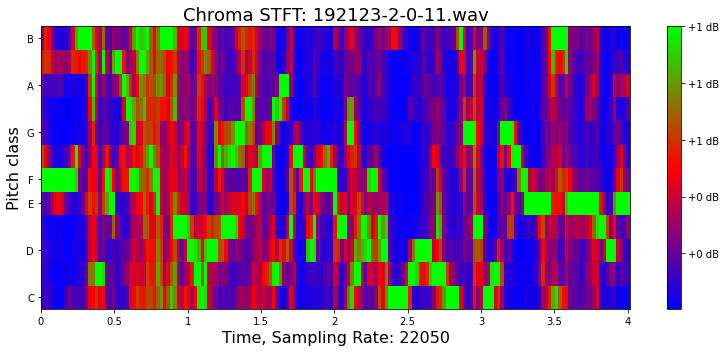

In [59]:
pluto.draw_melspectrogram(pluto.df_sound_data, is_chroma=True, cmap='brg')

In [60]:
# sound like resturant, child play
pluto.fname_id

22

# scratch

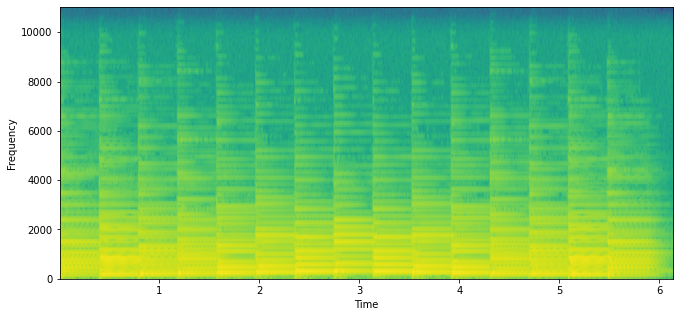

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
spec, freq, ts, ax = pic.specgram(pluto.audio_control_dmajor[0], 
  Fs=pluto.audio_control_dmajor[1],
  window=matplotlib.mlab.window_hanning)
pic.set_xlabel('Time')
pic.set_ylabel('Frequency')
canvas.show()

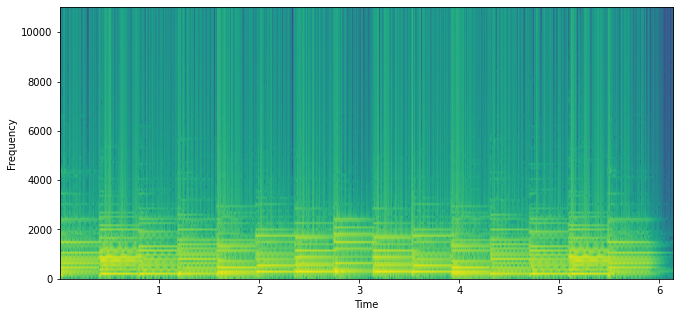

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
spec, freq, ts, ax = pic.specgram(pluto.audio_control_dmajor[0], 
  Fs=pluto.audio_control_dmajor[1],
  window=matplotlib.mlab.window_none)
pic.set_xlabel('Time')
pic.set_ylabel('Frequency')
canvas.show()

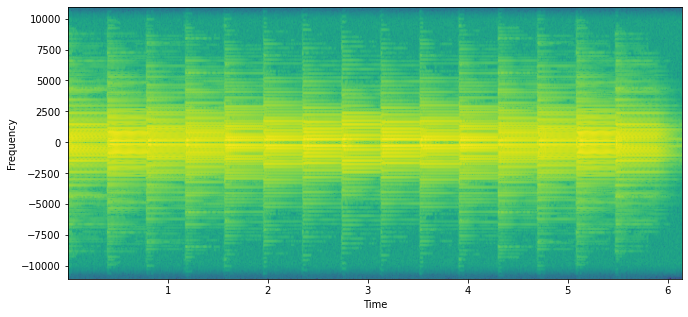

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
spec, freq, ts, ax = pic.specgram(pluto.audio_control_dmajor[0], 
  Fs=pluto.audio_control_dmajor[1],
  window=matplotlib.mlab.window_hanning,
  sides='twosided')
pic.set_xlabel('Time')
pic.set_ylabel('Frequency')
canvas.show()

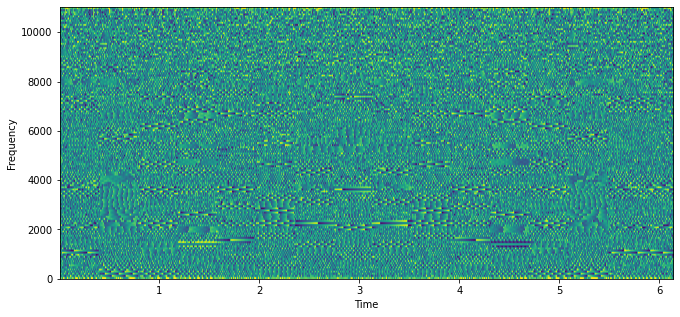

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
spec, freq, ts, ax = pic.specgram(pluto.audio_control_dmajor[0], 
  Fs=pluto.audio_control_dmajor[1],
  window=matplotlib.mlab.window_hanning,
  mode='angle')
pic.set_xlabel('Time')
pic.set_ylabel('Frequency')
canvas.show()

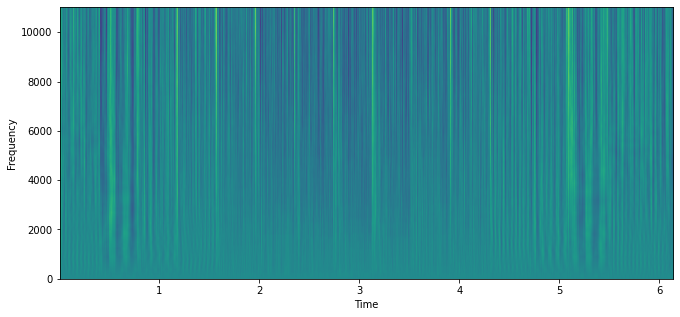

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
spec, freq, ts, ax = pic.specgram(pluto.audio_control_dmajor[0], 
  Fs=pluto.audio_control_dmajor[1],
  window=matplotlib.mlab.window_hanning,
  mode='phase')
pic.set_xlabel('Time')
pic.set_ylabel('Frequency')
canvas.show()

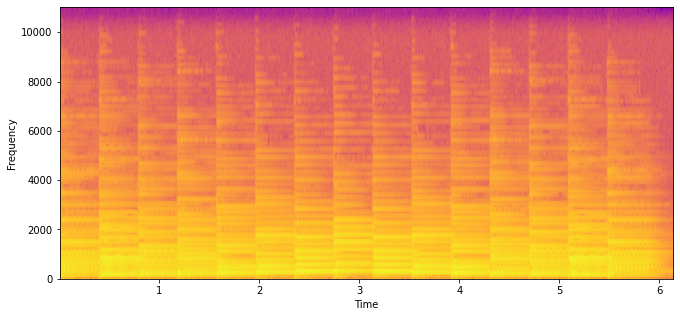

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
spec, freq, ts, ax = pic.specgram(pluto.audio_control_dmajor[0], 
  Fs=pluto.audio_control_dmajor[1],
  window=matplotlib.mlab.window_hanning,
  cmap='plasma')
pic.set_xlabel('Time')
pic.set_ylabel('Frequency')
canvas.show()

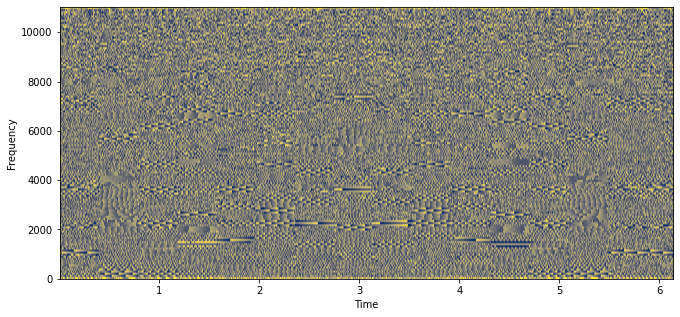

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
spec, freq, ts, ax = pic.specgram(pluto.audio_control_dmajor[0], 
  Fs=pluto.audio_control_dmajor[1],
  window=matplotlib.mlab.window_hanning,
  mode='angle',
  cmap='cividis')
pic.set_xlabel('Time')
pic.set_ylabel('Frequency')
canvas.show()

In [ ]:
# spect = librosa.feature.melspectrogram(y=y, sr=sr, n_fft=2048, hop_length=1024)
# mel_spect = librosa.power_to_db(spect, ref=np.max)
# librosa.display.specshow(mel_spect, y_axis='mel', fmax=8000, x_axis='time');
# #
# S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128,fmax=8000)
# S_dB = librosa.power_to_db(S, ref=np.max)
# img = librosa.display.specshow(S_dB, x_axis='time',
#                         y_axis='mel', sr=sr,
#                        fmax=8000, ax=ax)
# fig.colorbar(img, ax=ax, format='%+2.0f dB')
# ax.set(title='Mel-frequency spectrogram')

#### melspectrogram

In [ ]:
mel = librosa.feature.melspectrogram(y=pluto.audio_control_dmajor[0], 
  sr=pluto.audio_control_dmajor[1], 
  n_mels=128,fmax=8000)

In [ ]:
mel_db = librosa.power_to_db(mel, ref=numpy.max)

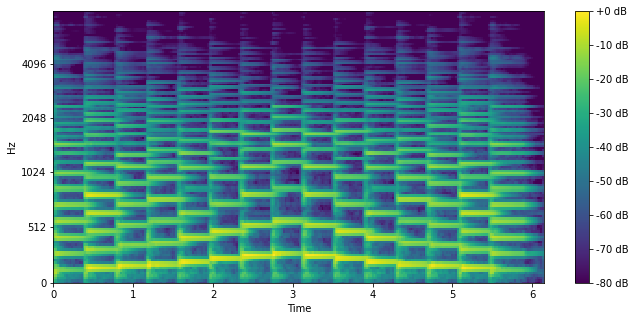

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))

img = librosa.display.specshow(mel_db, 
  sr=pluto.audio_control_dmajor[1],
  x_axis='time',
  y_axis='mel',
  fmax=8000, 
  ax=pic,
  cmap='viridis')
canvas.colorbar(img, ax=pic, format='%+2.0f dB')
canvas.show()

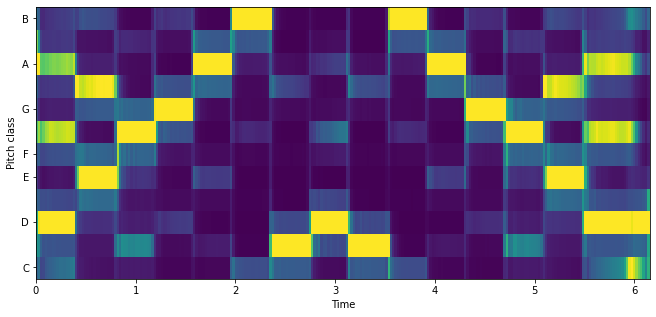

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 5))
# Create chromagrams
rb_chroma = librosa.feature.chroma_stft(pluto.audio_control_dmajor[0], 
  sr=pluto.audio_control_dmajor[1])
img = librosa.display.specshow(rb_chroma, y_axis = 'chroma', x_axis='time', ax=pic,
  cmap='viridis')
canvas.show()

In [ ]:
print('hello')

hello


In [ ]:
pluto.draw_audio(pluto.df_voice_data)

/usr/local/lib/python3.8/dist-packages/librosa/core/audio.py:165: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


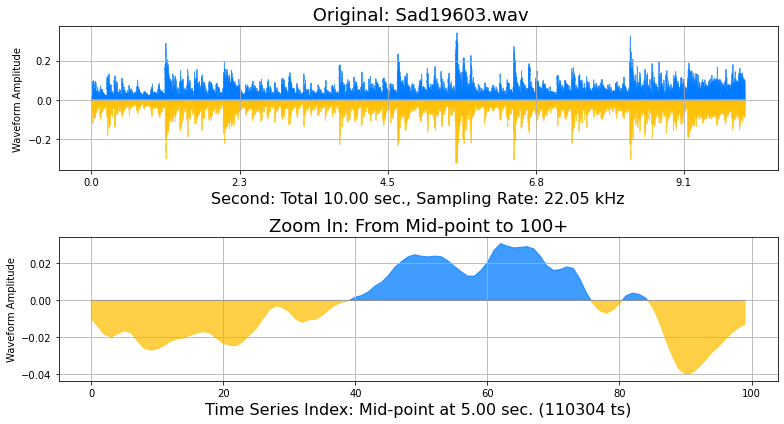

In [ ]:
pluto.draw_audio(pluto.df_music_data)

# Augmentation standard functions

- basic audio augmentation
  - Time shifting
  - Time stretching
  - Pitch scaling
  - Noise addition
  - Polarity Inversion
- Filters and masking
  - Filters


# Time shift

In [ ]:
# %CARRY-OVER

!pip install audiomentations

In [ ]:
# %%writefile -a {pluto_chapter_7}

import audiomentations
#
@add_method(PacktDataAug)
def _fetch_1_sample(self, df, dsize=1):
  p = df.sample(dsize)
  p.reset_index(drop=True, inplace=True)
  return p.fname[0]
#
@add_method(PacktDataAug)
def _audio_transform(self, df, xtransform, title=''):
  if (type(df) is list):
    data_amp, sam_rate, fname, lname = self.audio_control_dmajor
  else:
    lname = self._fetch_1_sample(df)
    data_amp, sam_rate, fname = self._fetch_audio_data(lname)
  #
  xaug = xtransform(data_amp, sample_rate=sam_rate)
  # augmented
  self._draw_audio(xaug, sam_rate, title + ' Augmented: ' + fname)
  display(IPython.display.Audio(xaug, rate=sam_rate))
  # original
  self._draw_audio(data_amp, sam_rate, 'Original: ' + fname)
  display(IPython.display.Audio(data_amp, rate=sam_rate))
  return

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_time_shift(self, df, min_fraction=-0.2,max_fraction=0.8,rollover=True,title='Time Shift'):
  xtransform = audiomentations.Shift(
    min_fraction = min_fraction,
    max_fraction = max_fraction,
    rollover = rollover,
    p=1.0
  )
  self._audio_transform(df, xtransform, title=title)
  return

In [ ]:
pluto.play_aug_time_shift(pluto.df_music_data, min_fraction=0.5)

In [ ]:
pluto.play_aug_time_shift(pluto.df_voice_data, min_fraction=0.5)

In [ ]:
pluto.play_aug_time_shift(pluto.df_sound_data, min_fraction=0.5)

In [ ]:
pluto.play_aug_time_shift(pluto.audio_control_dmajor, min_fraction=0.2)

# Time stretch

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_time_stretch(self, df, min_rate=0.2,max_rate=6.8,leave_length_unchanged=True,title='Time Stretch'):
  xtransform = audiomentations.TimeStretch(
    min_rate = min_rate,
    max_rate = max_rate,
    leave_length_unchanged = leave_length_unchanged,
    p=1.0
  )
  self._audio_transform(df, xtransform, title=title)
  return
  # librosa.effects.time_stretch under the hood 

In [ ]:
pluto.play_aug_time_stretch(pluto.audio_control_dmajor, max_rate=5.4)

In [ ]:
pluto.play_aug_time_stretch(pluto.df_music_data, max_rate=3.0)

In [ ]:
pluto.play_aug_time_stretch(pluto.df_voice_data, max_rate=3.5)

In [ ]:
pluto.play_aug_time_stretch(pluto.df_sound_data, max_rate=2.5)


In [ ]:
pluto.fname_id

# Pitch scaling

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_pitch_scaling(self, df, min_semitones=-6.0,max_semitones=6.0,title='Pitch Scaling'):
  xtransform = audiomentations.PitchShift(
    min_semitones = min_semitones,
    max_semitones = max_semitones,
    p=1.0)
  self._audio_transform(df, xtransform, title=title)
  return

In [ ]:
pluto.play_aug_pitch_scaling(pluto.audio_control_dmajor,min_semitones=-6.0,max_semitones=6.0)

In [ ]:
pluto.fname_id

In [ ]:
pluto.play_aug_pitch_scaling(pluto.df_music_data,min_semitones=-11.0, max_semitones=-9.0)

In [ ]:
pluto.play_aug_pitch_scaling(pluto.df_voice_data,min_semitones=-6.0, max_semitones=6.0)

In [ ]:
pluto.play_aug_pitch_scaling(pluto.df_sound_data,min_semitones=4.0, max_semitones=11.0)

# Noise injection, add Gaussian noise

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_noise_injection(self, df, min_amplitude=0.002,max_amplitude=0.2,title='Gaussian noise injection'):
  xtransform = audiomentations.AddGaussianNoise(
    min_amplitude = min_amplitude,
    max_amplitude = max_amplitude,
    p=1.0)
  self._audio_transform(df, xtransform, title=title)
  return

In [ ]:
pluto.play_aug_noise_injection(pluto.audio_control_dmajor, min_amplitude=0.02,max_amplitude=0.05)

In [ ]:
pluto.fname_id

In [ ]:
pluto.play_aug_noise_injection(pluto.df_music_data, max_amplitude=0.01)

In [ ]:
pluto.play_aug_noise_injection(pluto.df_voice_data, max_amplitude=0.01)

In [ ]:
pluto.play_aug_noise_injection(pluto.df_sound_data, max_amplitude=0.022)

# Polarity Inversion

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_polar_inverse(self, df, title='Polarity inversion'):
  xtransform = audiomentations.PolarityInversion(
    p=1.0)
  self._audio_transform(df, xtransform, title=title)
  return

In [ ]:
pluto.play_aug_polar_inverse(pluto.audio_control_dmajor)

In [ ]:
pluto.play_aug_polar_inverse(pluto.df_voice_data)

# Low pass Filter

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_low_pass_filter(self, df, 
  min_cutoff_freq=150, max_cutoff_freq=7500,
  min_rolloff=12, max_rolloff=24,
  title='Low pass filter'):
  xtransform = audiomentations.LowPassFilter(
    min_cutoff_freq = min_cutoff_freq,
    max_cutoff_freq = max_cutoff_freq,
    min_rolloff = min_rolloff,
    max_rolloff = max_rolloff,
    p=1.0)
  self._audio_transform(df, xtransform, title=title)
  return

In [ ]:
pluto.play_aug_low_pass_filter(pluto.audio_control_dmajor)

In [ ]:
pluto.play_aug_low_pass_filter(pluto.df_music_data)

In [ ]:
pluto.play_aug_low_pass_filter(pluto.df_voice_data)

In [ ]:
pluto.play_aug_low_pass_filter(pluto.df_sound_data)

#High pass filter

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_high_pass_filter(self, df, 
  min_cutoff_freq=20, max_cutoff_freq=2400,
  min_rolloff=12, max_rolloff=24,
  title='High pass filter'):
  xtransform = audiomentations.HighPassFilter(
    min_cutoff_freq = min_cutoff_freq,
    max_cutoff_freq = max_cutoff_freq,
    min_rolloff = min_rolloff,
    max_rolloff = max_rolloff,
    p=1.0)
  self._audio_transform(df, xtransform, title=title)
  return

In [ ]:
pluto.play_aug_high_pass_filter(pluto.audio_control_dmajor)

In [ ]:
pluto.play_aug_high_pass_filter(pluto.df_music_data)

In [ ]:
pluto.play_aug_high_pass_filter(pluto.df_voice_data)

In [ ]:
pluto.play_aug_high_pass_filter(pluto.df_sound_data)

# Band pass filter

In [ ]:
# %%writefile -a {pluto_chapter_7}

@add_method(PacktDataAug)
def play_aug_band_pass_filter(self, df, 
  min_center_freq=200, max_center_freq=4000,
  min_bandwidth_fraction=0.5,max_bandwidth_fraction=1.99,
  min_rolloff=12, max_rolloff=24,
  title='Band pass filter'):
  xtransform = audiomentations.BandPassFilter(
    min_center_freq = min_center_freq,
    max_center_freq = max_center_freq,
    min_bandwidth_fraction = min_bandwidth_fraction,
    max_bandwidth_fraction = max_bandwidth_fraction,
    min_rolloff = min_rolloff,
    max_rolloff = max_rolloff,
    p=1.0)
  self._audio_transform(df, xtransform, title=title)
  return

In [ ]:
pluto.play_aug_band_pass_filter(pluto.audio_control_dmajor)

In [ ]:
pluto.play_aug_band_pass_filter(pluto.df_music_data)

In [ ]:
pluto.play_aug_band_pass_filter(pluto.df_voice_data)

In [ ]:
pluto.play_aug_band_pass_filter(pluto.df_sound_data)

# Sneak peek (Optional)

In [ ]:
pluto.text_marry_lamb = 'Mary had a little lamb, whose fleece was white as snow. And everywhere that Mary went, the lamb was sure to go.'

In [ ]:
x = numpy.array([ord(c) for c in pluto.text_marry_lamb])

In [ ]:
k = pandas.DataFrame(x, columns=['tdata'])
k.head()

In [ ]:
canvas, pic = matplotlib.pyplot.subplots(1, 1, figsize=(11, 4))
# pics = pic.flatten()
pluto._draw_area_with_neg(x,pic,izero=64)
pic.set_title('Text Time-series graph: Marry had a little lamb...', fontsize=18.)
pic.set_xlabel('Character, letters are blue, punctuations are yellow', fontsize=16.)
pic.set_ylabel('ASCII value')
pic.grid()
# 
# display and save image
canvas.tight_layout()
pluto._drop_image(canvas)
canvas.show()

# Push up all changes (Optional)

- username: duchaba

- password: [use the token]

In [ ]:
# import os
# f = 'Data-Augmentation-with-Python'
# os.chdir(f)
# !git add -A
# !git config --global user.email "duc.haba@gmail.com"
# !git config --global user.name "duchaba"
# !git commit -m "end of session"
# # do the git push in the xterm console
# #!git push

In [ ]:
# %%script false --no-raise-error  #temporary stop execute for export file

In [ ]:
# f = 'pluto-img-'+str(pluto.fname_id)+'.zip'
# print(f)
# !zip {f} /content/Data-Augmentation-with-Python/pluto_img/*

pluto-img-16.zip
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto10.jpg (deflated 3%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto11.jpg (deflated 1%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto12.jpg (deflated 4%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto13.jpg (deflated 4%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto14.jpg (deflated 8%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto15.jpg (deflated 7%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto16.jpg (deflated 6%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto1.jpg (deflated 4%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto2.jpg (deflated 5%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto3.jpg (deflated 3%)
  adding: content/Data-Augmentation-with-Python/pluto_img/pluto4.jpg (deflated 19%)
  adding: content/Data-Augmentation-with-Python/pluto_img/plut

# Summary 

Every chaper will begin with same base class "PacktDataAug".

✋ FAIR WARNING:

- The coding uses long and complete function path name.

- Pluto wrote the code for easy to understand and not for compactness, fast execution, nor cleaverness.

- Use Xterm to debug cloud server



In [ ]:
# !pip install colab-xterm
# %load_ext colabxterm
# %xterm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 KB 4.3 MB/s eta 0:00:00


Launching Xterm...

<IPython.core.display.Javascript object>